In [1]:
from churchland_pipeline_python import *
from churchland_pipeline_python.utilities import dataviz
from pacman_pipeline_python import *

import datajoint as dj
import numpy as np
import colorcet as cc

%load_ext autoreload
%autoreload 2

Connecting njm2149@datajoint.u19motor.zi.columbia.edu:3306


# dataviz

In [2]:
dataviz.plot_table?

Signature:
dataviz.plot_table(
    table: datajoint.user_tables.OrderedClass,
    y: str,
    x: str = None,
    group_by: Tuple[str] = (),
    stack_by: Tuple[str] = (),
    ignore: Tuple[str] = (),
    track: Tuple[str] = (),
    map_fcn: Any = None,
    map_args: Any = None,
    layout: dict = None,
    style: dict = None,
    axes: dict = None,
    labels: dict = None,
) -> None
Docstring:
Plot DataJoint table.

Flexible function for plotting any attribute from a DataJoint table.
Generates one or more figures composed of one or more subplots.
Use optional group_by parameter to specify which attributes to aggregate within a figure.
Use optional stack_by parameter to specify which attributes to stack within a subplot.
Add layout, style, axes dictionarys to overwrite default parameters.
Add labels dict to convert attribute names to axes labels/figure titles.

Args:
    table (DataJointTable): table (base or derived)
    y (str): attribute name to plot on y-axis
    x (str, optional): 

## Behavior

In [8]:
session_key = {'session_date': '2019-12-16'}

pacman_behavior.Force() 
# pacman_behavior.Force & session_key
# pacman_behavior.Force & session_key & (pacman_processing.GoodTrial & 'good_trial')

session_date session date,monkey monkey name,condition_id condition ID number,trial session trial number,alignment_params_id alignment params ID number,filter_params_id filter params ID number,"force_raw raw (online), aligned force signal (V)","force_filt filtered, aligned, and calibrated force (N)"
2019-12-16,Cousteau,35,11,0,0,=BLOB=,=BLOB=
2019-12-16,Cousteau,35,33,0,0,=BLOB=,=BLOB=
2019-12-16,Cousteau,35,45,0,0,=BLOB=,=BLOB=
2019-12-16,Cousteau,35,73,0,0,=BLOB=,=BLOB=
2019-12-16,Cousteau,35,82,0,0,=BLOB=,=BLOB=
2019-12-16,Cousteau,35,109,0,0,=BLOB=,=BLOB=
2019-12-16,Cousteau,35,121,0,0,=BLOB=,=BLOB=
2019-12-16,Cousteau,35,140,0,0,=BLOB=,=BLOB=
2019-12-16,Cousteau,35,156,0,0,=BLOB=,=BLOB=
2019-12-16,Cousteau,35,179,0,0,=BLOB=,=BLOB=


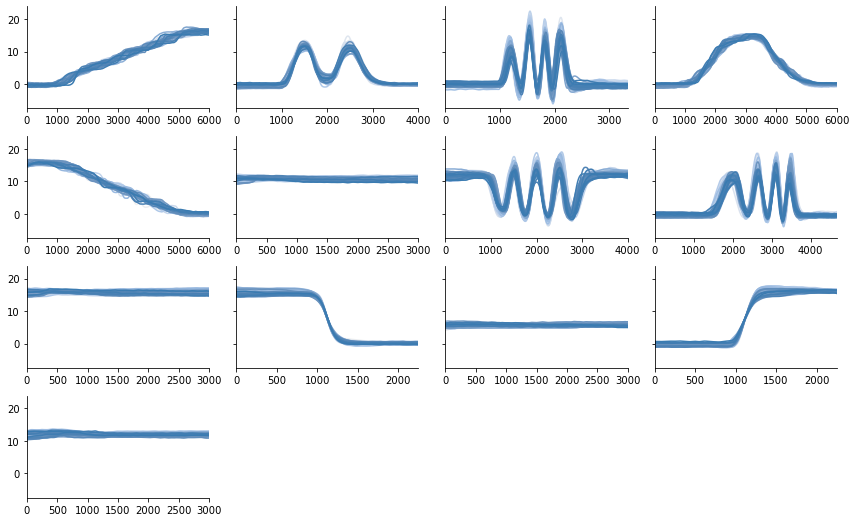

In [27]:
# basic plot: group by conditions, stack by trials and share y-axes
trial_forces = pacman_behavior.Force & session_key & (pacman_processing.GoodTrial & 'good_trial')

dataviz.plot_table(trial_forces, y='force_filt', group_by=('condition_id',), stack_by=('trial',), axes=dict(sharey=True))

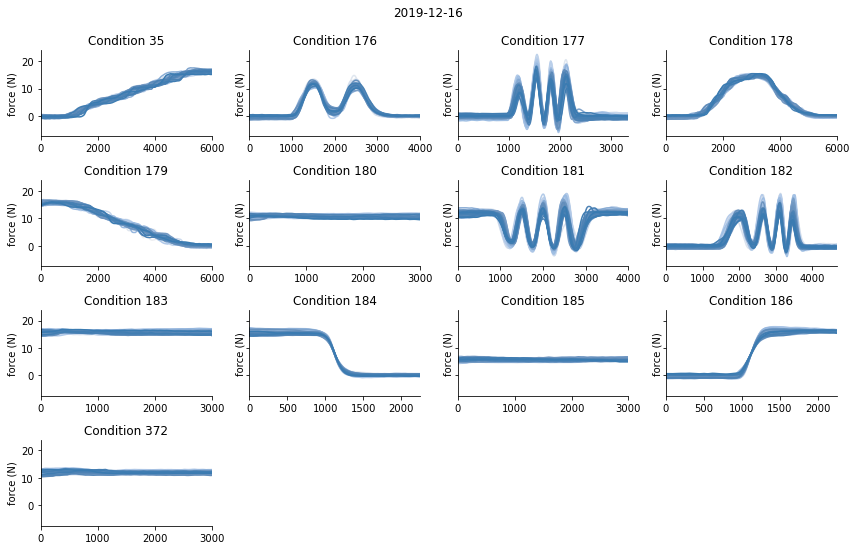

In [28]:
# add labels using attribute values
dataviz.plot_table(
    trial_forces,
    y='force_filt', 
    group_by=('condition_id',), 
    stack_by=('trial',),
    axes=dict(sharey=True), 
    labels=dict(session_date=r'{}', condition_id=r'Condition {}', force_filt='force (N)')
)

In [26]:
# each condition has a time vector and target force profile, constructed using the sample rate from that session
# note that there are many more force entries than condition entries, but the tables can still be joined to associate the behavior with the trial time
pacman_acquisition.Behavior.Condition()

session_date session date,monkey monkey name,condition_id condition ID number,condition_time condition time vector (s),condition_force condition force profile (N)
2018-04-13,Cousteau,0,=BLOB=,=BLOB=
2018-04-20,Cousteau,0,=BLOB=,=BLOB=
2018-04-13,Cousteau,1,=BLOB=,=BLOB=
2018-04-20,Cousteau,1,=BLOB=,=BLOB=
2018-04-13,Cousteau,2,=BLOB=,=BLOB=
2018-04-20,Cousteau,2,=BLOB=,=BLOB=
2018-04-13,Cousteau,3,=BLOB=,=BLOB=
2018-04-20,Cousteau,3,=BLOB=,=BLOB=
2018-04-13,Cousteau,4,=BLOB=,=BLOB=
2018-04-20,Cousteau,4,=BLOB=,=BLOB=


In [29]:
# join forces with condition table to get the time vectors
trial_forces * pacman_acquisition.Behavior.Condition()

session_date session date,monkey monkey name,condition_id condition ID number,trial session trial number,alignment_params_id alignment params ID number,filter_params_id filter params ID number,"force_raw raw (online), aligned force signal (V)","force_filt filtered, aligned, and calibrated force (N)",condition_time condition time vector (s),condition_force condition force profile (N)
2019-12-16,Cousteau,35,11,0,0,=BLOB=,=BLOB=,=BLOB=,=BLOB=
2019-12-16,Cousteau,35,33,0,0,=BLOB=,=BLOB=,=BLOB=,=BLOB=
2019-12-16,Cousteau,35,45,0,0,=BLOB=,=BLOB=,=BLOB=,=BLOB=
2019-12-16,Cousteau,35,73,0,0,=BLOB=,=BLOB=,=BLOB=,=BLOB=
2019-12-16,Cousteau,35,82,0,0,=BLOB=,=BLOB=,=BLOB=,=BLOB=
2019-12-16,Cousteau,35,109,0,0,=BLOB=,=BLOB=,=BLOB=,=BLOB=
2019-12-16,Cousteau,35,121,0,0,=BLOB=,=BLOB=,=BLOB=,=BLOB=
2019-12-16,Cousteau,35,140,0,0,=BLOB=,=BLOB=,=BLOB=,=BLOB=
2019-12-16,Cousteau,35,156,0,0,=BLOB=,=BLOB=,=BLOB=,=BLOB=
2019-12-16,Cousteau,35,179,0,0,=BLOB=,=BLOB=,=BLOB=,=BLOB=


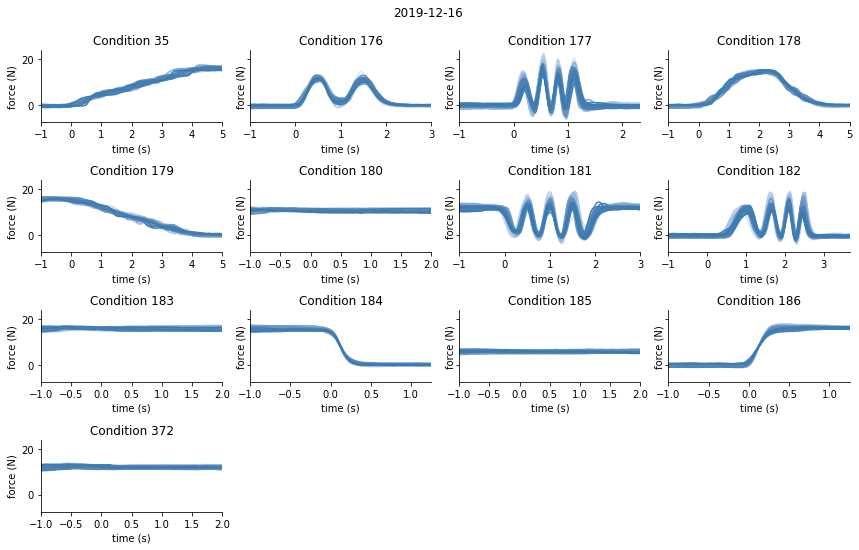

In [34]:
# use condition time attribute as x-value
dataviz.plot_table(
    trial_forces * pacman_acquisition.Behavior.Condition,
    y='force_filt', 
    x='condition_time',
    group_by=('condition_id',), 
    stack_by=('trial',),
    axes=dict(sharey=True), 
    labels=dict(session_date=r'{}', condition_id=r'Condition {}', force_filt='force (N)', condition_time='time (s)')
)

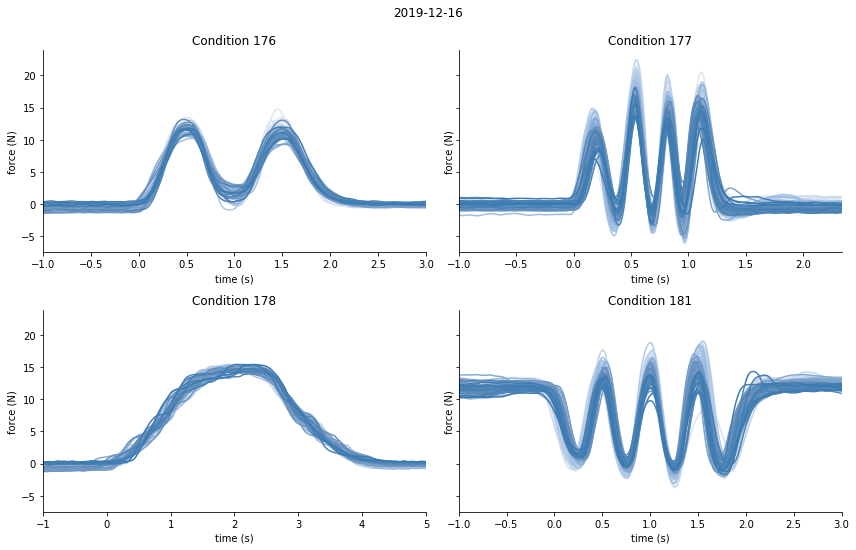

In [35]:
# restrict conditions to sinusoids
dataviz.plot_table(
    trial_forces * pacman_acquisition.Behavior.Condition \
        & (pacman_acquisition.ConditionParams.Sine)
        ,
    y='force_filt', 
    x='condition_time',
    group_by=('condition_id',), 
    stack_by=('trial',),
    axes=dict(sharey=True), 
    labels=dict(session_date=r'{}', condition_id=r'Condition {}', force_filt='force (N)', condition_time='time (s)')
)

## Neural responses

### PSTHs

In [37]:
pacman_brain.NeuronPsth()

session_date session date,monkey monkey name,ephys_file_id ephys recording file ID number,brain_region_abbr brain region abbreviation,brain_channel_group_id brain channel group ID number,brain_sort_id brain sort ID number,neuron_id neuron ID number,alignment_params_id alignment params ID number,behavior_block_id behavior block ID number,condition_id condition ID number,behavior_quality_params_id behavior quality params ID number,filter_params_id filter params ID number,neuron_psth neuron trial-averaged firing rate (spikes/s),neuron_psth_sem neuron firing rate standard error (spikes/s)
2019-08-13,Cousteau,0,M1,0,0,0,0,0,35,0,0,=BLOB=,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,0,0,0,176,0,0,=BLOB=,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,0,0,0,177,0,0,=BLOB=,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,0,0,0,178,0,0,=BLOB=,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,0,0,0,179,0,0,=BLOB=,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,0,0,0,180,0,0,=BLOB=,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,0,0,0,181,0,0,=BLOB=,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,0,0,0,182,0,0,=BLOB=,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,0,0,0,183,0,0,=BLOB=,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,0,0,0,184,0,0,=BLOB=,=BLOB=


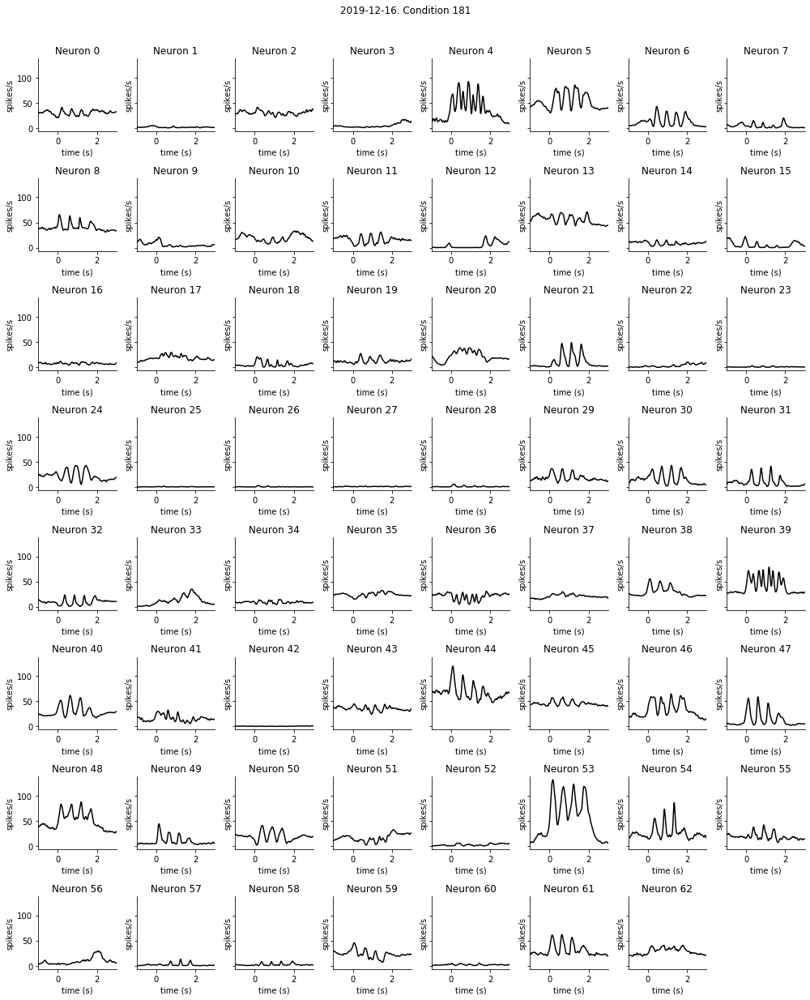

In [38]:
# plot neuron PSTHs for 2 Hz sinusoid
# set color to black for all traces
# note figures/subplots/lines autolimited; can be overriden
dataviz.plot_table(
    pacman_brain.NeuronPsth * pacman_acquisition.Behavior.Condition
        & session_key
        & (pacman_acquisition.ConditionParams.Sine & {'target_frequency': 2}),
    y='neuron_psth', 
    x='condition_time', 
    group_by=('neuron_id',),
    axes=dict(sharey=True), 
    style=dict(color='k'), 
    layout=dict(limit_subplots=None, figsize=(14,18)),
    labels=dict(session_date=r'{}', condition_id=r'Condition {}', neuron_psth='spikes/s', neuron_id='Neuron {}', condition_time='time (s)')
)

### Spike rasters

In [36]:
pacman_brain.NeuronSpikeRaster()

session_date session date,monkey monkey name,ephys_file_id ephys recording file ID number,brain_region_abbr brain region abbreviation,brain_channel_group_id brain channel group ID number,brain_sort_id brain sort ID number,neuron_id neuron ID number,condition_id condition ID number,trial session trial number,alignment_params_id alignment params ID number,neuron_spike_raster neuron trial-aligned spike raster (boolean array)
2019-08-13,Cousteau,0,M1,0,0,0,35,2,0,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,0,35,22,0,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,0,35,54,0,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,0,35,73,0,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,0,35,83,0,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,0,35,98,0,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,0,35,112,0,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,0,35,129,0,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,0,35,159,0,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,0,35,180,0,=BLOB=


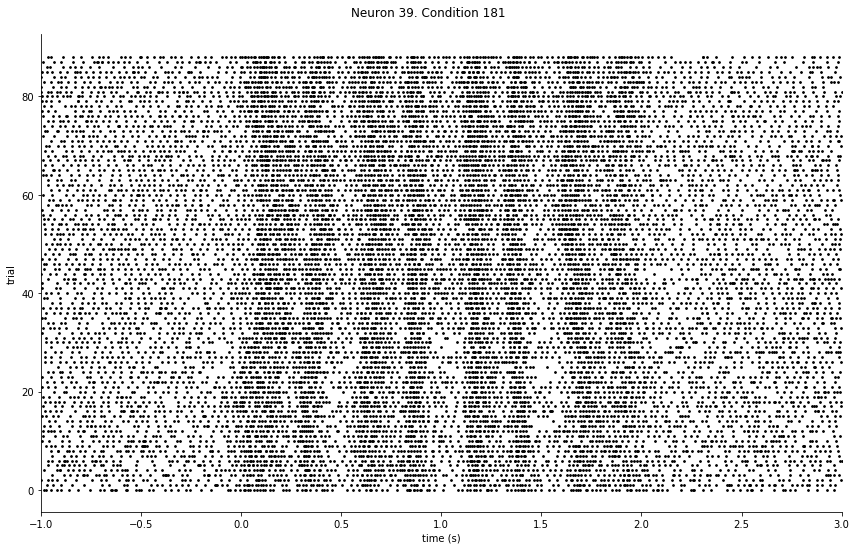

In [39]:
# plot spike raster for neuron 39 (40th neuron -- 0 indexing) from 2 Hz sinusoidal condition from 2019-12-16
dataviz.plot_table(
    pacman_brain.NeuronSpikeRaster * pacman_acquisition.Behavior.Condition
        & session_key
        & (pacman_acquisition.ConditionParams.Sine & {'target_frequency': 2})
        & (pacman_processing.GoodTrial & 'good_trial')
        & {'neuron_id': 39},
    y='neuron_spike_raster', 
    x='condition_time', 
    stack_by=('trial',),
    style=dict(kind='raster', color='k'),
    labels=dict(session_id=r'Session {}', condition_id=r'Condition {}', neuron_spike_raster='trial', neuron_id='Neuron {}', condition_time='time (s)')
)

## EMG

In [40]:
pacman_muscle.Emg()

session_date session date,monkey monkey name,ephys_file_id ephys recording file ID number,muscle_abbr muscle abbreviation,emg_channel_group_id emg channel group ID number,ephys_channel_idx channel index in data array,condition_id condition ID number,trial session trial number,alignment_params_id alignment params ID number,emg_signal EMG voltage signal
2018-04-13,Cousteau,0,AntDel,0,0,0,66,0,=BLOB=
2018-04-13,Cousteau,0,AntDel,0,0,0,76,0,=BLOB=
2018-04-13,Cousteau,0,AntDel,0,0,0,104,0,=BLOB=
2018-04-13,Cousteau,0,AntDel,0,0,0,126,0,=BLOB=
2018-04-13,Cousteau,0,AntDel,0,0,0,142,0,=BLOB=
2018-04-13,Cousteau,0,AntDel,0,0,0,153,0,=BLOB=
2018-04-13,Cousteau,0,AntDel,0,0,0,171,0,=BLOB=
2018-04-13,Cousteau,0,AntDel,0,0,0,187,0,=BLOB=
2018-04-13,Cousteau,0,AntDel,0,0,0,197,0,=BLOB=
2018-04-13,Cousteau,0,AntDel,0,0,0,212,0,=BLOB=


In [41]:
# restrict by session, condition and good trials. join with behavior
emg_table = pacman_muscle.Emg * pacman_acquisition.Behavior.Condition \
    & session_key \
    & (pacman_acquisition.ConditionParams.Sine & {'target_frequency': 2}) \
    & (pacman_processing.GoodTrial & 'good_trial')

emg_table

session_date session date,monkey monkey name,ephys_file_id ephys recording file ID number,muscle_abbr muscle abbreviation,emg_channel_group_id emg channel group ID number,ephys_channel_idx channel index in data array,condition_id condition ID number,trial session trial number,alignment_params_id alignment params ID number,emg_signal EMG voltage signal,condition_time condition time vector (s),condition_force condition force profile (N)
2019-12-16,Cousteau,0,LatTri,0,128,181,2,0,=BLOB=,=BLOB=,=BLOB=
2019-12-16,Cousteau,0,LatTri,0,129,181,2,0,=BLOB=,=BLOB=,=BLOB=
2019-12-16,Cousteau,0,LatTri,0,130,181,2,0,=BLOB=,=BLOB=,=BLOB=
2019-12-16,Cousteau,0,LatTri,0,131,181,2,0,=BLOB=,=BLOB=,=BLOB=
2019-12-16,Cousteau,0,LatTri,0,132,181,2,0,=BLOB=,=BLOB=,=BLOB=
2019-12-16,Cousteau,0,LatTri,0,133,181,2,0,=BLOB=,=BLOB=,=BLOB=
2019-12-16,Cousteau,0,LatTri,0,134,181,2,0,=BLOB=,=BLOB=,=BLOB=
2019-12-16,Cousteau,0,LatTri,0,135,181,2,0,=BLOB=,=BLOB=,=BLOB=
2019-12-16,Cousteau,0,LatTri,0,128,181,12,0,=BLOB=,=BLOB=,=BLOB=
2019-12-16,Cousteau,0,LatTri,0,129,181,12,0,=BLOB=,=BLOB=,=BLOB=


In [42]:
# unique trials in emg table
dj.U('trial') & emg_table

trial session trial number
2
12
20
26
28
43
48
72
75
98


In [49]:
# associate each trial with a random number
dj.U('trial').aggr(emg_table, rnd_id='rand()')

trial session trial number,rnd_id calculated attribute
2,0.2010184323424645
12,0.8802212550120626
20,0.6760621328615231
26,0.3835584971900643
28,0.49691479420002066
43,0.5045352433850385
48,0.07758396126104888
72,0.8545339571819957
75,0.6060667369571204
98,0.36884093970883725


In [54]:
# order trials by random number and fetch the first
trial_key = dj.U('trial').aggr(emg_table, rnd_id='rand()').fetch('KEY', order_by='rnd_id', limit=1)
trial_key

[{'trial': 886}]

In [56]:
# Butterworth filter function
processing.Filter.Butterworth.filt

<function churchland_pipeline_python.processing.Filter.Butterworth.filt(self, y: numpy.ndarray, fs: int, order: int = None, low_cut: int = None, high_cut: int = None, axis: int = 0, normalize: bool = False) -> numpy.ndarray>

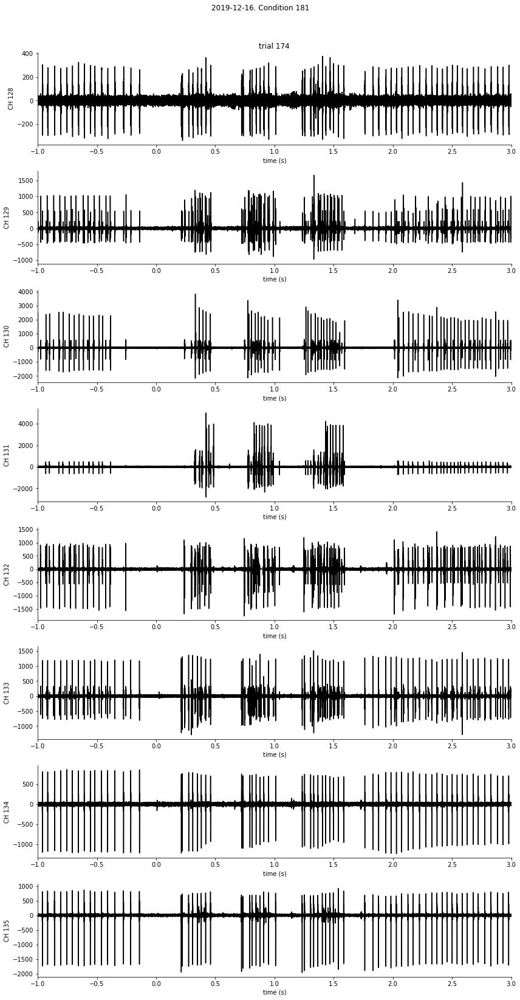

In [59]:
# plot random EMG trial
# map highpass Butterworth to y-data
trial_key = dj.U('trial').aggr(emg_table, rnd_id='rand()').fetch('KEY', order_by='rnd_id', limit=1)

butter_hp500 = (processing.Filter.Butterworth & {'low_cut': 500}).filt

dataviz.plot_table(emg_table & trial_key,
    y='emg_signal', 
    x='condition_time', 
    map_fcn=butter_hp500, 
    map_args=(3e4,),
    style=dict(color='k'), 
    layout=dict(grid_attr=('ephys_channel_idx','trial'), figsize=(12,24)),
    labels=dict(
        session_date=r'{}', 
        condition_id=r'Condition {}', 
        trial='trial {}', 
        ephys_channel_idx='CH {}', 
        condition_time='time (s)'
    )
)

## Neuron templates

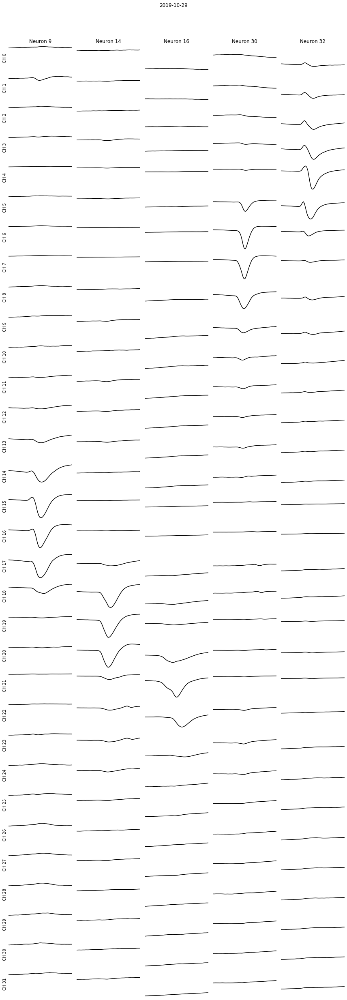

In [85]:
# draw a random session when we recorded with s-probes
s_probe_session_key = dj.U('session_date') \
    .aggr(acquisition.BrainChannelGroup & {'electrode_array_model': 'S-Probe'}, rnd_id='rand()') \
    .fetch('KEY', limit=1, order_by='rnd_id')

# draw 5 random neurons from the session
neuron_keys = dj.U(*processing.Neuron.primary_key) \
    .aggr(processing.Neuron & s_probe_session_key, rnd_id='rand()') \
    .fetch('KEY', limit=5, order_by='rnd_id')

# plot the neuron templates ordered by position on the probe
dataviz.plot_table(
    processing.Neuron.Template * acquisition.BrainChannelGroup * equipment.ElectrodeArrayConfig.Electrode \
        & neuron_keys,
    y='neuron_template', 
    ignore=('ephys_channel_idx',),
    axes=dict(sharey='row'),
    style=dict(color='k', remove_spines=('top','right','bottom','left'), show_x_ticks=False, show_y_ticks=False),
    layout=dict(grid_attr=('electrode_idx', 'neuron_id'), figsize=(12,36)),
    labels=dict(session_date=r'{}', electrode_idx=r'CH {}', neuron_id=r'Neuron {}')
)

A word about git...

(checkout dataviz)

In [ ]:
# plot target forces overlaid on trial forces
dataviz.plot_table(
    pacman_behavior.Force * pacman_acquisition.Behavior.Condition
        * pacman_acquisition.ConditionParams().proj_label(n_sigfigs=2)
        * pacman_acquisition.ConditionParams().proj_rank()
        & session_key
        & pacman_acquisition.ConditionParams.Sine
        & (pacman_processing.GoodTrial & 'good_trial')
    ,
    y_attributes=['force_filt', 'condition_force'],
    x_attributes='condition_time',
    group_by='condition_id',
    stack_by='trial',
    order_by='condition_rank',
    axes=[
        dataviz.Axis(
            labels=dict(
                force_filt='force (N)'
            )
        ),
        dataviz.Axis(
            y_lim=(-6,24),
            color_map='r',
            map_fcn=np.unique,
            map_kwargs=dict(axis=0),
            labels=dict(
                condition_label=r'{}',
                condition_time='time (s)',
                session_date=r'session: {}',
            )
        )
    ],
    layout=dataviz.Layout(
        figsize=(12,8),
        y_attribute_coords=np.array([(0,0,0), (0,0,1)]),
    )
)

In [ ]:
# plot forces, spikes, and average firing rates for one neuron and condition, vertically stacked
dataviz.plot_table(
    pacman_behavior.Force * pacman_brain.NeuronRate * pacman_brain.NeuronSpikeRaster
        * pacman_acquisition.Behavior.Condition
        * pacman_acquisition.ConditionParams().proj_label(n_sigfigs=2)
        * pacman_acquisition.ConditionParams().proj_rank()
        & session_key
        & {'neuron_id': 39}
        & (pacman_acquisition.ConditionParams.Sine & {'target_frequency': 2})
        & (pacman_processing.GoodTrial & 'good_trial')
    ,
    y_attributes=['force_filt', 'neuron_rate', 'neuron_spike_raster'],
    x_attributes='condition_time',
    group_by='condition_id',
    stack_by='trial',
    order_by='condition_rank',
    axes=[
        dataviz.Axis(
            color_map=cc.linear_ternary_blue_0_44_c57,
            spines=['left'],
            y_lim=(-6,24),
            x_ticks='off',
            labels=dict(
                condition_label=r'{}',
                force_filt='force (N)'
            ),
        ),
        dataviz.Axis(
            spines=['left'],
            sharey=True,
            y_lim=(0,None),
            x_ticks='off',
            color_map=cc.linear_ternary_blue_0_44_c57,
            map_fcn=np.mean,
            map_kwargs=dict(axis=0, keepdims=True),
            labels=dict(
                neuron_rate='PSTH (spikes/s)',
            ),
        ),
        dataviz.Axis(
            kind='raster',
            marker_size=2,
            color_map=cc.linear_ternary_blue_0_44_c57,
            labels=dict(
                condition_time='time (s)',
                neuron_spike_raster='trial',
            ),
        ),
    ],
    layout=dataviz.Layout(
        figsize=(8,12),
        y_attribute_coords=np.array([(0,0,0), (1,0,0), (2,0,0)]),
    )
)

# Plotly (interactive plots)

In [ ]:
import plotly.express as px
import plotly.graph_objects as go

In [ ]:
# plotly express provides out of the box interactive plots
fs = int(1e3)
t = np.linspace(0, 1, 1+fs)
y1 = np.cos(2*np.pi*t)
px.line(x=t, y=y1)

In [ ]:
# enable/disable figure elements via legend (and compare data on hover!)
y2 = np.sin(2*np.pi*t)

fig = go.Figure()
fig.add_trace(go.Scatter(x=t, y=y1, name='cos'))
fig.add_trace(go.Scatter(x=t, y=y2, name='sin'))
fig.show()

checkout pacman visualization

In [ ]:
# sample dash app
pacman_brain.NeuronPsth().dash_app(mode='external')

In [ ]:
from njm2149_pipeline_python.pacman import neural_manifold

In [ ]:
X, condition_ids, condition_times, condition_keys, neuron_keys = pacman_brain.NeuronPsth().fetch_psths()

In [ ]:
X_norm = (X - X.mean(axis=1, keepdims=True)) / X.ptp(axis=1, keepdims=True)

In [ ]:
neural_manifold.plot_neural_state(X_norm, condition_ids, condition_keys, pc_condition_set_name='dynamic_12', component_ids=(0,1,2));